<a href="https://colab.research.google.com/github/Sandeep354/dog_breed_classification/blob/main/dog_breed_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#!unzip "/content/drive/My Drive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/My Drive/Dog Vision/"

For the first time, unzip those folder but after its done, no need to unzip it everytime.
So just comment it

# 🐶 End-to-end Multi-class dog breed classification

This notebook builds an end-to-end multi-class image classifier
using `TensorFlow 2.0` and `TensorFlow Hub`.

## 1. Problem

Identifying the breed of the dog, given the image of the dog.

When i'm sitting at the cafe and i take a photo of the dog, i need to able to tell what breed it is.

## 2. Data

The data we are using is from Kaggle's dog-breed-identification competition: https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilitiesfor each dog breed of each test image. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:

* We're dealing with images (unstructured data) so it's probably best to use Deep Learning/Transfer Learning
* There are 120 dog breeds (this means there are 120 different classes)
* There are 10,000 + images in training set (these images have labels)
* There are 10000 + images in test set (these images doesn't have labels, beacuse we have to predict them)

## Get our Workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using GPU

In [ ]:
# Import TensorFlow in colab
import tensorflow as tf
print ("TensorFlow version:", tf.__version__ )

TensorFlow version: 2.3.0


#### If you don't have TF 2.x, then do the following


    try:
        # %tensorflow_version only exists in colab (not jupyter)
        %tensorflow_version 2.x
    except Exception:
        pass

In [ ]:
import tensorflow_hub as hub
print ("TF Hub version :", hub.__version__)

TF Hub version : 0.9.0


In [ ]:
# Check for GPU availability 
print ("GPU", "available(YESSS)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available(YESSS)


## Getting our data ready (turn into Tensors)

With all machine learning models, our data has to be in numerical format. So , we will first turn images into tensors (numerical representation)

Lets start by accesing the data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/My Drive/Dog Vision/labels.csv")
print (labels_csv.describe())
print (labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     2ae2f3582606b45659a29dbff0311ac4  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
komondor                 67
brabancon_griffon        67
briard                   66
eskimo_dog               66
Name: breed, Length: 120, dtype: int64

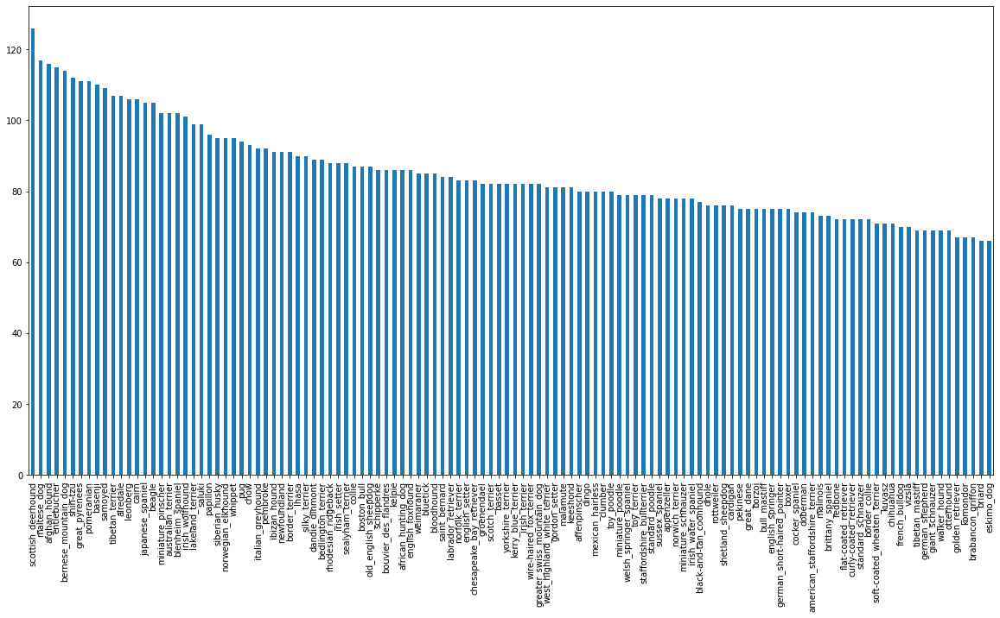

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

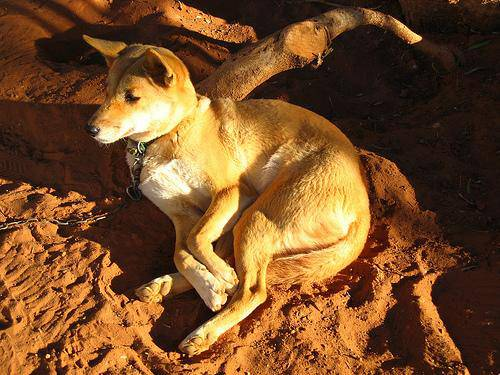

In [ ]:
# Lets view an image
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting Images and their Labels

Lets get a list of all of our images file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image IDs
filename = [fname for fname in labels_csv["id"]]

# Check the first 10
filename[:10]

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64']

In [ ]:
# Create pathnames from image IDs with full path with extension
filenames = ["drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir("drive/My Drive/Dog Vision/train/")[:10]


['ec53887c5887ec7be3693459ad3ba4ed.jpg',
 'eb921996f4cc09c35970d0c18a415a2f.jpg',
 'f1e4f7a6a490bd1bb2bfcb5586902e9e.jpg',
 'ecaec07d20ed3a12fc32314cf83c9370.jpg',
 'f382107c98a4aa6d80a5b6a6df18e669.jpg',
 'edcf20f5ebcab09f0db88d0358b3ab56.jpg',
 'f485d0ea64f8950b38954c17cfd03d8f.jpg',
 'edeb63f8216445c1fd9572929e5e2557.jpg',
 'f5d4d250dfe2f60b155ec2f40df73936.jpg',
 'f591763666758b806f71459819ce8602.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames):
  print ("Filenames match actual amount of files. Proceed!!")
else:
  print ("Filenames do not match the amount of files. Check the target directory")


Filenames match actual amount of files. Proceed!!


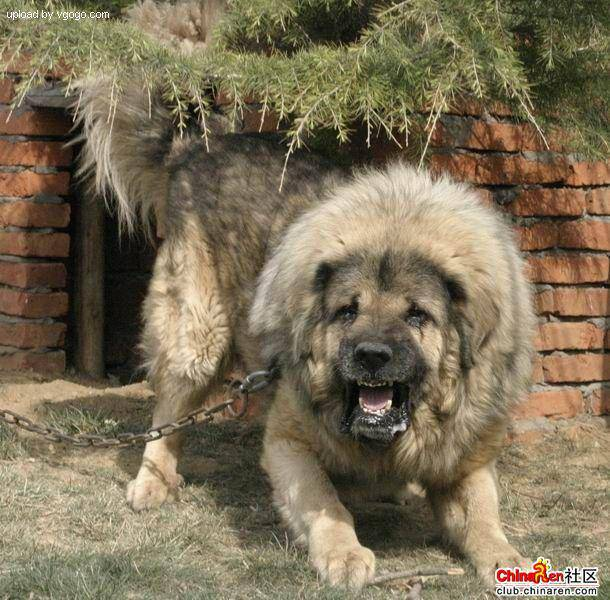

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv.breed[9000]

'tibetan_mastiff'

Since now we've got our training image files in a list, lets prepare our labels

In [ ]:
labels = labels_csv["breed"]
labels

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [ ]:
import numpy as np
labels = np.array(labels)
labels

#labels = labels_csv["breed"].to_numpy() --> Another method

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels match the number of filenames
if len(labels) == len(filenames):
  print ("Number of labels matches number of filenames. Good!!")
else:
  print ("Number of labels does not match the number of filenames. Check the data directory")

Number of labels matches number of filenames. Good!!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds, len(unique_breeds)

(array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter', 'gre

In [ ]:
# Turn a single label into array of booleans
print (labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example : Turning boolean array into integers
print (labels[0]) #original label
print (np.where(unique_breeds == labels[0])) # index where label occurs
print (boolean_labels[0].argmax()) # index where label occurs in boolean array
print (boolean_labels[0].astype(int)) # there will be 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print (labels[2])
print (boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own Validation set

Since Kaggle dataset doesn't come with validation set, we are going to create our own

In [ ]:
# Setup X and y variables
X = filenames #Data
y = boolean_labels #Labels

In [ ]:
len(X)

10222

We're going to start off experimenting with 1000 images and increase as needed (Vecause using 10000 will take up a lot of time)

In [ ]:
# Set the number of images to use for experimenting
# Using a magic function to create a slider
NUM_IMAGES = 1000 # @param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Lets split our data into train and validation 
from sklearn.model_selection import train_test_split

# Split them into Training and Validation set of total size:NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Lets have a quick look at the training data
X_train[:5], y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprocessing Images (turning images into Tensors)

To preprocess the images into tensors, we are going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to variable `image`
3. Turn our `image` (jpeg) into Tensors
4. Normalize the tensors (from channel values of 0-225 into 0-1)
5. Resize the `image` to be of shape (224, 224)
6. Return the modified `image`

Before we do, lets see what importing an image looks like.

In [ ]:
# Convert an image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

(x, y, z) is the RGB Channel. Every image pixel is a combination of Red Green Blue color.

 So the arrays below show the different combination of each pixel of the image.

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
# Turn Image into Tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]
# Arrays are same as image

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

**Now we have seen what an image looks like as a Tensor, lets make a function to preprocess them:**
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to variable `image`
3. Turn our `image` (jpeg) into Tensors
4. Normalize the tensors (from channel values of 0-225 into 0-1)
5. Resize the `image` to be of shape (224, 224)
6. Return the modified `image`


In [ ]:
# Step2 : Read an image file
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
# Step3 : Convert tensors into channel values (channel=3 means RBG values)
tensor = tf.image.decode_jpeg(tensor, channels=3)
tensor

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

In [ ]:
# Step4 : Normalizing (converting 0-225 values into 0-1)
tensor = tf.image.convert_image_dtype(tensor, tf.float32)
tensor

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

In [ ]:
# Step5 : Resize the image into desired shape (we want 224x224)
tf.image.resize(tensor, size = [224, 224])

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.25410587, 0.2894    , 0.2776353 ],
        [0.29784313, 0.33313724, 0.32137254],
        [0.29804096, 0.33333507, 0.32157037],
        ...,
        [0.41461015, 0.46559054, 0.38715917],
        [0.44833592, 0.4993163 , 0.42088494],
        [0.44921985, 0.5002003 , 0.42176887]],

       [[0.27608263, 0.31137675, 0.29961205],
        [0.30547515, 0.34076926, 0.32900456],
        [0.2880393 , 0.3233334 , 0.3115687 ],
        ...,
        [0.41783687, 0.46881726, 0.3903859 ],
        [0.46009547, 0.51107585, 0.4326445 ],
        [0.48616162, 0.537142  , 0.45871064]],

       [[0.29875293, 0.33404705, 0.3144392 ],
        [0.27189255, 0.30718666, 0.28757882],
        [0.28608775, 0.32138187, 0.30177402],
        ...,
        [0.47503573, 0.5260161 , 0.44758475],
        [0.49345425, 0.54443467, 0.46600327],
        [0.4703167 , 0.5212971 , 0.44286573]],

       ...,

       [[0.77551085, 0.7260472 , 0.59820485],
        [0.86

**Now putting all these steps in a function**

In [ ]:
# Define Image Size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image file path and turns the image into Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into Numeric tensor with 3 color channel (RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the color channel values from 0-225 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to desired value (224, 224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Lets say you're trying to process 10000+ images in one go, they all might not fit into memory. Instead we use a batch of few images at a time.

So, thats why we do about 32 (Yann LeCun) (this is the batch size we will use) images at a time (you can manually adjust the batch size if need be)

In order to use TensorLow effectively, we need our data in from of Tensor tuples, which look like this:
`(image, label)`

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image path name and associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[40]), tf.constant(y[40]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.99609005, 0.96119833, 0.95770377],
         [0.98501533, 0.94666374, 0.93379605],
         [0.99749774, 0.9770274 , 0.9565523 ],
         ...,
         [0.34569168, 0.5497533 , 0.22850783],
         [0.4276134 , 0.6322353 , 0.33483163],
         [0.36833197, 0.5772412 , 0.29097825]],
 
        [[0.9687435 , 0.965289  , 0.9172323 ],
         [0.94134724, 0.93233955, 0.8760108 ],
         [0.92182285, 0.9180851 , 0.8512452 ],
         ...,
         [0.36644298, 0.57037514, 0.24943131],
         [0.36225268, 0.5662274 , 0.2703323 ],
         [0.34930357, 0.5534058 , 0.27435333]],
 
        [[0.82989013, 0.87487435, 0.75133675],
         [0.7506709 , 0.7958162 , 0.66784185],
         [0.75523835, 0.8078179 , 0.67545015],
         ...,
         [0.40426058, 0.60512996, 0.2932135 ],
         [0.35947898, 0.55773896, 0.2682605 ],
         [0.38644102, 0.5856088 , 0.3115852 ]],
 
        ...,
 
        [[0.45484307, 0.5300532 

Now we've got a way to turn our data into tuples of Tensors in the form `(image, label)`.
Lets make a function to turn all our our data (X & y) into batches.

In [ ]:
# Define batch size, 32 is a good start
BATCH_SIZE = 32

# Lets create a function to turn data into batches
def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image(X) and label(y) pairs.
  Shuffles the data if it's training data but doesn't shuffle ifits validation data.
  Also accepts test data as input (no labels)
  """
  
  # If the data is test data, we probably dont have labels
  if test_data:
    print ("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths, no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print ("Creating validaton data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y))) # filepaths and labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print ("Creating training training data batches....")
    # Turn filepath and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(X)) # shuffle the whole data

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch
                                  

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training training data batches....
Creating validaton data batches....


In [ ]:
# Check out different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data batches

Our data is now in batches. However these can be hard to understand/comprehend. So lets visulaize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function viewing images in data batches
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and lables from data batch.
  """

  # Set up the figure
  plt.figure(figsize=(10,10))

  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows and 5 columns)
    ax = plt.subplot(5, 5, i+1) # rows, cols, index
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.6886905 , 0.5122199 , 0.28084734],
          [0.697444  , 0.52097344, 0.28960085],
          [0.7058824 , 0.5294118 , 0.29803923],
          ...,
          [0.7767858 , 0.6042367 , 0.365021  ],
          [0.77647066, 0.6       , 0.36862746],
          [0.77647066, 0.6       , 0.36862746]],
 
         [[0.6886905 , 0.5122199 , 0.28084734],
          [0.697444  , 0.52097344, 0.28960085],
          [0.7058824 , 0.5294118 , 0.29803923],
          ...,
          [0.7767858 , 0.6042367 , 0.365021  ],
          [0.77647066, 0.6       , 0.36862746],
          [0.77647066, 0.6       , 0.36862746]],
 
         [[0.6886905 , 0.5122199 , 0.28084734],
          [0.697444  , 0.52097344, 0.28960085],
          [0.7058824 , 0.5294118 , 0.29803923],
          ...,
          [0.7767858 , 0.6042367 , 0.365021  ],
          [0.77647066, 0.6       , 0.36862746],
          [0.77647066, 0.6       , 0.36862746]],
 
         ...,
 
         [[0.35143557, 0.21810226, 0.06908264],
          [0.36411

In [ ]:
len(train_images), len(train_labels)

(32, 32)

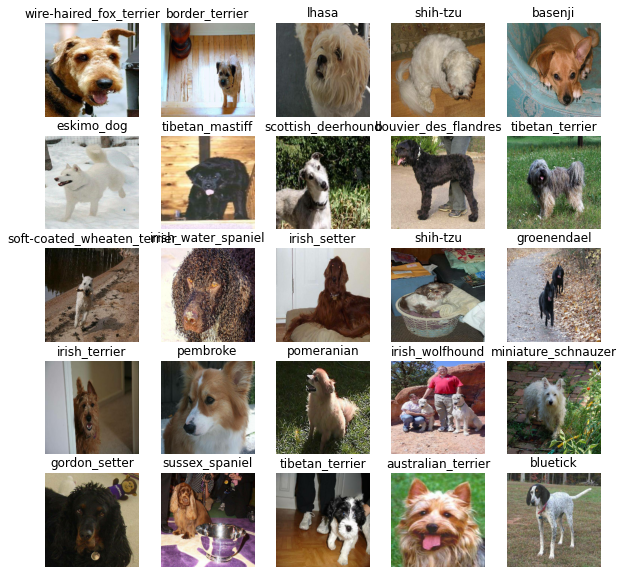

In [ ]:
# Now lets visualise our data in training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

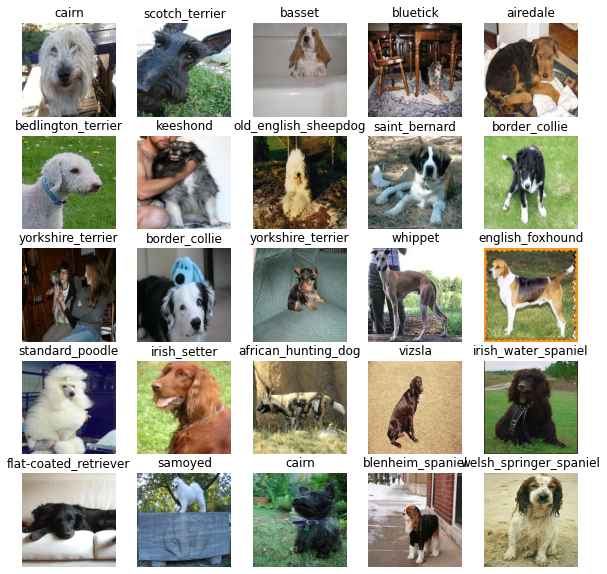

In [ ]:
# Lets visulaize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
1. Input shape (image shape, in form of Tensors) to our model.
2. The output shape (image labbels, in form of Tensors) of our model.
3. The URL of our model from Tensor Flow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our input, outputs and model ready to go.
Lets put them together into Keras deep learning model!

Knowing this, lets create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Define layers in Keras model in sequential fashion (do this first, then this, then that...)
* Compiles the model (says it should be evaluated and improved)
* Build the model (tells the model, the input shape it will be getting)
* Returns the model

All of these can be found here - https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
# Create a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print ("Building model with:", MODEL_URL)

  # Setup the model layer
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer1 - input layer
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") #Layer2 - output layer
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks

Callbacks are `helper functions` that a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress (seeing that loss is reducing and accuracy is increasing) and another for early stopping, which prevents our model from training too long (prevent overfiting).

## TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the tensorboard extension
2. Create a tensorboard callback which is able to save logs to a directory and pass it to our model's `fit()` function
3. Visualize our model's training logs with the `%tensorboard` magic function (we'll do this after model training)

In [ ]:
# Load TensorBoard Notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs (in Dog Vision folder, create a 'log' folder)
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so that the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(log_dir=logdir)


## Early stopping callback

Early stopping helps stop our model from overfitting by stoping training if a certain evaluation metric stops improving.


https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create Early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training our model (on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working (time and RAM saving)

In [ ]:
NUM_EPOCHS = 100 # @param {type:"slider", min:10, max:100, step:10}

In [ ]:
# check to make sure we're still running GPU
print ("GPU", "available YES!!!" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available YES!!!


Lets create a function that trains a model.

* Create a model using `create_model()` (*made by us*)
* Setup a TensorBoard callback using `create_tensorboard_callback()` (*made by us*)
* Call the `fit()` function on our model, passing it training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and returm trained model

def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model (track preformance)
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 1/25 [>.............................] - ETA: 0s - loss: 5.8433 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


25/25 [==============================] - 368s 15s/step - loss: 4.5368 - accuracy: 0.1150 - val_loss: 3.3366 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 6s 225ms/step - loss: 1.6219 - accuracy: 0.6950 - val_loss: 2.0631 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 6s 225ms/step - loss: 0.5698 - accuracy: 0.9337 - val_loss: 1.6370 - val_accuracy: 0.5750
Epoch 4/100
25/25 [==============================] - 6s 226ms/step - loss: 0.2538 - accuracy: 0.9837 - val_loss: 1.4322 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 6s 224ms/step - loss: 0.1498 - accuracy: 0.9950 - val_loss: 1.3494 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 6s 221ms/step - loss: 0.1013 - accuracy: 0.9975 - val_loss: 1.3028 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============================] - 6s 225ms/step - loss: 0.0757 - accuracy: 1.0000 - val_loss: 1.2815 - val_accuracy: 0.6600
Epoch 8/100

## Our 1st epoch takes the most time as it is fitting the data to the GPU.

Epoch 13/100 is the last as the model is overfiting and early_stopping() has stopped as val_accuracy hasn't increased for 3 consecutive time

**Question:** It looks like our model is overfitting because its performing far better on training dataset than the validation dataset. What are some ways to prevent overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is good. It means our model is learning.

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating a prediction using a trained model

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Make prediction on validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose is used to show the progress (here, to show progress while making predictions)
predictions


7/7 [==============================] - 1s 156ms/step


array([[3.04223620e-03, 2.87748826e-05, 2.63836421e-03, ...,
        3.05330293e-04, 2.28076533e-05, 5.71937859e-03],
       [4.99760092e-04, 1.83430544e-04, 9.65806656e-03, ...,
        2.08137394e-03, 7.15225702e-04, 1.09825087e-04],
       [2.25112926e-05, 4.92582658e-05, 2.86510985e-05, ...,
        6.45014443e-05, 1.16840629e-05, 9.00896703e-05],
       ...,
       [3.71329384e-06, 4.29757310e-05, 3.24339344e-05, ...,
        4.36450682e-06, 7.58516471e-05, 2.45280971e-04],
       [2.27528252e-03, 6.18217236e-05, 7.09164742e-05, ...,
        1.44077276e-04, 2.85618607e-05, 4.90672095e-03],
       [8.60759348e-04, 1.12018955e-04, 4.25250269e-03, ...,
        1.61362570e-02, 4.50224383e-03, 3.66125489e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
predictions[0]
# This is like predict-proba --> probability on each breed in given as array

array([3.0422362e-03, 2.8774883e-05, 2.6383642e-03, 3.9833929e-05,
       9.3885337e-04, 5.6507897e-06, 1.0505728e-02, 4.9267069e-04,
       1.4202812e-04, 1.4299390e-04, 3.8205527e-04, 7.8215402e-05,
       4.3940000e-04, 2.9783594e-04, 2.1097023e-04, 1.3435367e-03,
       2.7679922e-05, 1.9173235e-01, 4.6857665e-05, 8.0979538e-05,
       3.8949272e-04, 2.1838520e-04, 5.9598948e-05, 1.9267723e-03,
       2.8752936e-05, 6.2500039e-05, 2.6551071e-01, 4.9291226e-05,
       1.0543524e-03, 1.2299730e-04, 7.4854947e-06, 2.3586000e-03,
       4.5468230e-04, 7.9804659e-06, 5.8649723e-05, 3.8136579e-03,
       6.5459019e-05, 5.8622882e-05, 7.2135510e-05, 8.2787177e-05,
       1.2818691e-03, 1.0002734e-05, 1.9145942e-04, 2.0734806e-05,
       5.5630793e-05, 1.7930938e-04, 5.1190746e-06, 6.8469020e-04,
       3.5990475e-04, 2.9572297e-04, 2.1902501e-04, 1.7100621e-04,
       1.8685429e-04, 4.8384984e-05, 5.8431433e-05, 5.7018566e-05,
       1.1038600e-04, 5.5894381e-03, 1.2769963e-04, 1.6679503e

In [ ]:
len(predictions[0])

120

In [ ]:
np.sum(predictions[0])
# P(breed1) + P(breed2) + .... P(breed120) ~= 1

1.0

In [ ]:
# Similarily
np.sum(predictions[1])

1.0

In [ ]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of predictions) : {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[3.0422362e-03 2.8774883e-05 2.6383642e-03 3.9833929e-05 9.3885337e-04
 5.6507897e-06 1.0505728e-02 4.9267069e-04 1.4202812e-04 1.4299390e-04
 3.8205527e-04 7.8215402e-05 4.3940000e-04 2.9783594e-04 2.1097023e-04
 1.3435367e-03 2.7679922e-05 1.9173235e-01 4.6857665e-05 8.0979538e-05
 3.8949272e-04 2.1838520e-04 5.9598948e-05 1.9267723e-03 2.8752936e-05
 6.2500039e-05 2.6551071e-01 4.9291226e-05 1.0543524e-03 1.2299730e-04
 7.4854947e-06 2.3586000e-03 4.5468230e-04 7.9804659e-06 5.8649723e-05
 3.8136579e-03 6.5459019e-05 5.8622882e-05 7.2135510e-05 8.2787177e-05
 1.2818691e-03 1.0002734e-05 1.9145942e-04 2.0734806e-05 5.5630793e-05
 1.7930938e-04 5.1190746e-06 6.8469020e-04 3.5990475e-04 2.9572297e-04
 2.1902501e-04 1.7100621e-04 1.8685429e-04 4.8384984e-05 5.8431433e-05
 5.7018566e-05 1.1038600e-04 5.5894381e-03 1.2769963e-04 1.6679503e-01
 3.3945619e-04 2.6681384e-05 6.4806838e-04 8.4987605e-06 1.3577548e-03
 2.3729187e-02 1.1840593e-05 8.3309226e-04 3.8814191e-03 6.7899142e-05
 1.812

In [ ]:
# Another prediction trial
index = 42
print(predictions[index])
print(f"Max value (probability of predictions) : {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.42727292e-05 1.28040047e-04 4.00162135e-05 5.25516589e-06
 2.32906919e-03 7.81069029e-05 2.41818576e-04 9.08520597e-04
 1.21074012e-02 1.92008447e-02 1.39011136e-05 1.46931752e-05
 6.93866241e-05 1.86607102e-03 4.66100406e-04 2.40835641e-03
 1.62094657e-05 3.54243704e-04 1.20274686e-04 3.32017662e-04
 3.40892693e-05 4.87849378e-04 3.79853227e-05 5.39866378e-05
 1.21779479e-02 3.79401754e-05 6.82052678e-06 1.62435492e-04
 2.23256618e-04 2.57929332e-05 2.97096049e-05 2.16424578e-05
 1.20724930e-04 1.36740900e-05 1.32109504e-04 4.64982259e-05
 1.73240318e-04 1.82224994e-05 7.04436898e-05 2.57972300e-01
 1.32716916e-04 8.71230350e-06 4.80516627e-03 1.08167251e-05
 1.54053458e-04 3.31866977e-05 1.37829993e-04 5.41937770e-04
 1.65171477e-05 2.35305575e-04 1.33937428e-04 1.35911891e-04
 7.82215502e-05 1.09453721e-03 6.36350705e-06 2.75810802e-04
 7.56092195e-05 2.35376519e-05 3.67895613e-04 1.70219973e-05
 5.93292643e-05 9.47802735e-04 1.06001071e-05 2.49803034e-05
 1.27251813e-04 1.639047

Having the above functionality is great but we want to be able to do it at scale.

And it would be better if we could see the image, the prediction is made on.

**Note:** Prediction probabilities are also know of Confidence Intervals/Levels.

In [ ]:
# Turn prediction probabilities into their respective label --> easier to understand
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in batch, we'll have to unbatch to make predictions on the validation images and compare those predictions to truth labels.

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
# Truth labels
get_pred_label(labels_[0])

'cairn'

In [ ]:
# Predicted label
get_pred_label(predictions[0])

'cairn'

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of image labels (tensors) and returns a seperate arrays of image and labels
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  
  return images, labels

# Unbatchfy the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0]) 

'affenpinscher'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Lets make some function make these all visual.

We'll create a function which:
* Takes an array of prediction of probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a perdicted label
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get prediction label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks (axes)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted label, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
                                   color = color)

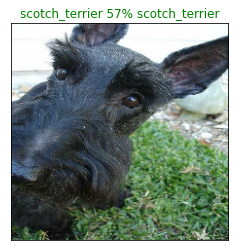

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images)

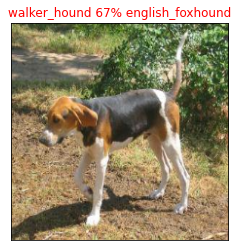

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=42)

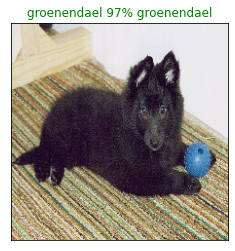

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=77)

Now we've got one function to visualize our model's prediction. Lets make another to view our model's top 10 predictions.

The function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the predicted label using `get_pred_label()`
* Find the Top 10:
  * Prediction probabilities indexs
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
predictions[0]

array([3.0422362e-03, 2.8774883e-05, 2.6383642e-03, 3.9833929e-05,
       9.3885337e-04, 5.6507897e-06, 1.0505728e-02, 4.9267069e-04,
       1.4202812e-04, 1.4299390e-04, 3.8205527e-04, 7.8215402e-05,
       4.3940000e-04, 2.9783594e-04, 2.1097023e-04, 1.3435367e-03,
       2.7679922e-05, 1.9173235e-01, 4.6857665e-05, 8.0979538e-05,
       3.8949272e-04, 2.1838520e-04, 5.9598948e-05, 1.9267723e-03,
       2.8752936e-05, 6.2500039e-05, 2.6551071e-01, 4.9291226e-05,
       1.0543524e-03, 1.2299730e-04, 7.4854947e-06, 2.3586000e-03,
       4.5468230e-04, 7.9804659e-06, 5.8649723e-05, 3.8136579e-03,
       6.5459019e-05, 5.8622882e-05, 7.2135510e-05, 8.2787177e-05,
       1.2818691e-03, 1.0002734e-05, 1.9145942e-04, 2.0734806e-05,
       5.5630793e-05, 1.7930938e-04, 5.1190746e-06, 6.8469020e-04,
       3.5990475e-04, 2.9572297e-04, 2.1902501e-04, 1.7100621e-04,
       1.8685429e-04, 4.8384984e-05, 5.8431433e-05, 5.7018566e-05,
       1.1038600e-04, 5.5894381e-03, 1.2769963e-04, 1.6679503e

In [ ]:
predictions[0].argsort()

array([ 46,   5,  99,  30, 115,  33,  63, 112,  41,  66,  84,  92,  43,
       118, 107, 101,  61,  16,  24,   1, 108,   3,  94,  18,  53,  27,
        44,  95,  55,  54,  37,  34,  22,  25,  36,  69,  38,  11,  88,
        19,  39,  72,  56,  29,  58,   8,   9, 113,  71,  51, 105,  45,
        52,  42,  14,  21,  50,  91, 111, 114,  49,  13,  86, 117,  60,
        48,  74,  10,  20,  12,  82,  32,  75,  98,  89,  78,   7,  85,
       104,  90,  62,  87,  47,  93,  96,  67,   4, 110,  28, 116,  40,
        15,  80,  64, 102,  23,  81,  31,   2,   0,  35,  68,  77, 109,
        57, 119,  83,   6,  97,  76, 106, 100,  70,  79,  65, 103,  73,
        59,  17,  26])

In [ ]:
# Top 10 predictions indexes in ascending order
predictions[0].argsort()[-10:] 

array([106, 100,  70,  79,  65, 103,  73,  59,  17,  26])

In [ ]:
# Top 10 predictions indexes in descending order
predictions[0].argsort()[-10:][::-1]

array([ 26,  17,  59,  73, 103,  65,  79,  70, 100, 106])

In [ ]:
# Top 10 predictions
predictions[0][predictions[0].argsort()[-10:][::-1]] 

array([0.2655107 , 0.19173235, 0.16679503, 0.09725167, 0.06899221,
       0.02372919, 0.02018134, 0.01812647, 0.0175836 , 0.01532883],
      dtype=float32)

In [ ]:
predictions[0].max()

0.2655107

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

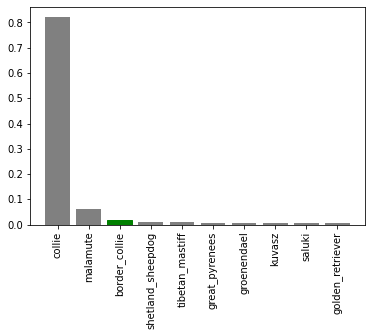

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=9)

Now we've got some functions to visualize our predictions and evaluate our model. Lets check out a few

In [ ]:
# Lets check out a few predictions and their different values

def plot_images_and_pred(i_multiplier=0):

  num_rows = 3
  num_cols = 2
  num_images = num_rows * num_cols
  plt.figure(figsize=(10*num_cols, 5*num_rows))

  for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities=predictions,
              labels = val_labels,
              images = val_images,
              n = i + i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
                  labels = val_labels,
                  n = i + i_multiplier)

  # these next two codes are not even necessary (it would give the same output)  
  plt.tight_layout(h_pad=1.0)
  plt.show()
  
  

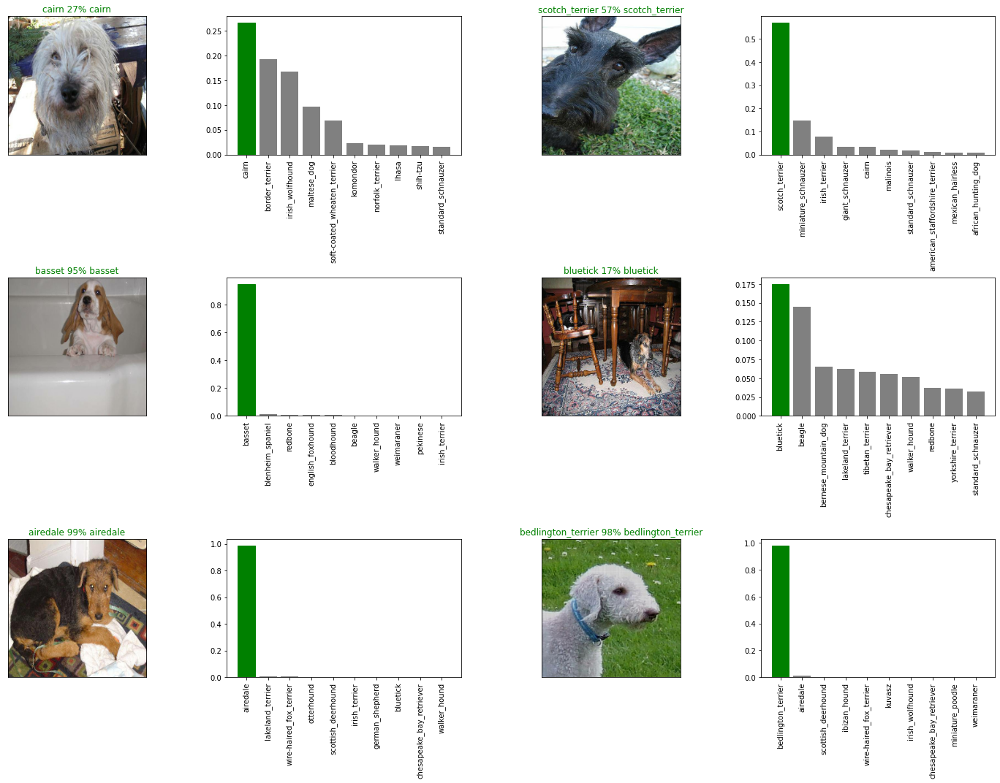

In [ ]:
plot_images_and_pred(i_multiplier=0)

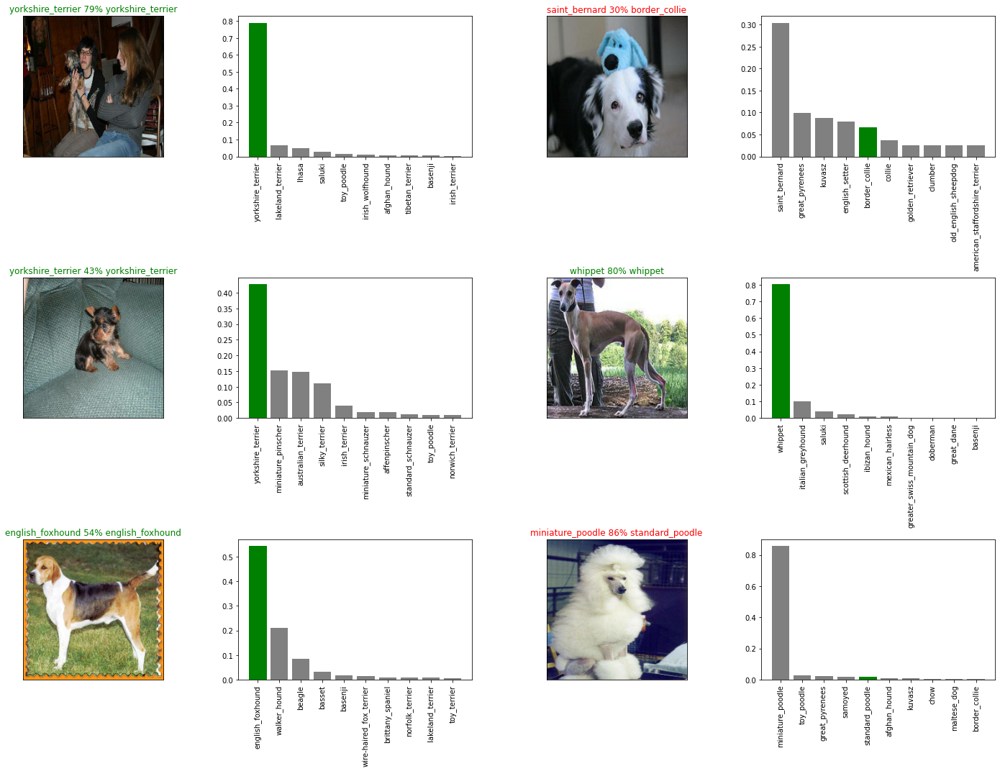

In [ ]:
plot_images_and_pred(10)

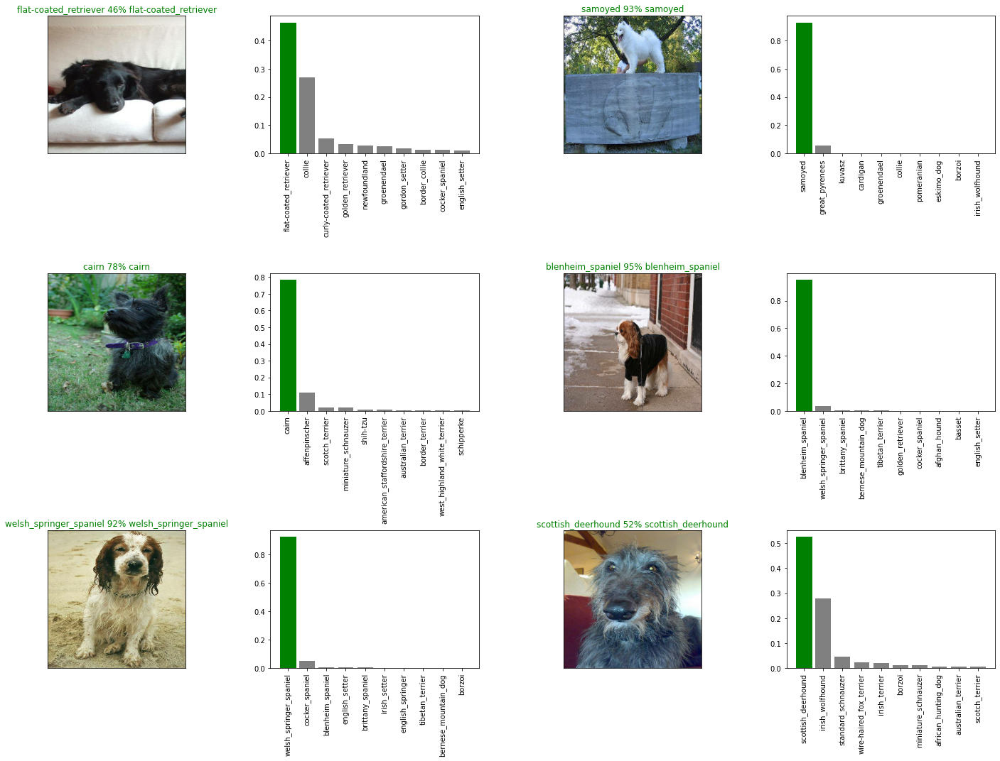

In [ ]:
plot_images_and_pred(20)

## Saving and reloading our model (trained model)

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in 'Dog Vision/models' directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models", 
                          datetime.datetime.now().strftime("%Y%m%d-&H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # .h5 is file format of model (HDF5 .h5 extension)
  print (f"Saving model to: {model_path} ....")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from specified path
  """
  print (f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects ={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model. Lets make sure they work

In [ ]:
# Save our model trained on a 1000 images (to communicate: 1.only 1000 out of 10k has been trained, 2.the optimizer used-->Adam, etc)
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20201006-&H051601996709-1000-images-mobilenetv2-Adam.h5 ....


'drive/My Drive/Dog Vision/models/20201006-&H051601996709-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load the trained model
loaded_1000_image_model = load_model("drive/My Drive/Dog Vision/models/20201006-&H571601989074-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/Dog Vision/models/20201006-&H571601989074-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 139ms/step - loss: 1.1872 - accuracy: 0.7050


[1.187206506729126, 0.7049999833106995]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 141ms/step - loss: 1.2178 - accuracy: 0.6600


[1.2178269624710083, 0.6600000262260437]

## Training a big model data (on the full data)






len(X), len(y)
# X - filenames, y - label

X[:10]

X_train[:10]

len(X_train)

y[:2]

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training training data batches....


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while
(maybe upto 90 minutes for 1st epoch) beacuse the GPU we're using has to load all of the images into memory.

In [ ]:
# Fit the full model to the full_model
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

# Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we `created create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames. 
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels). 
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

In [ ]:
len(test_filenames)

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

In [ ]:
test_data

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
#np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predctions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

In [ ]:
test_predictions.shape

# Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. 
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
list(unique_breeds)

In [ ]:
# These will be our columns
["id"] + list(unique_breeds)

In [ ]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

In [ ]:
# This will give the image id and jpeg 
os.path.splitext(path) 

In [ ]:
# Append test image IDs to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids

In [ ]:
# Filling the id column
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle (Export to csv file)
preds_df.to_csv("drive/My Drive/Dog Vision/full-model-predictions-submission-1-mobilenetv2.csv",
                index = False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images
* Turn the filepaths into databatches using `create_data_batches()`. And since our images wont have labels, we set `test_data` parameter to True.
* We pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels
* Compare the predicted label to custom images

In [ ]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/(name of the file)"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

In [ ]:
# Turn custom images into data batches
custom_data = create_data_bathches(custom_image_paths, test_data=True)
custom_data

In [ ]:
# Make predictions on custom images
custom_preds = loaded_full_model.predict(custom_data)
custom_preds

In [ ]:
custom_preds.shape

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

In [ ]:
# Get custom images (our unbatchify() function wont work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1) #rows, cols, index (+1 coz it starts from 0)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)